In [22]:
import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report, confusion_matrix, roc_auc_score, recall_score
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
import sklearn

from imblearn.ensemble import BalancedRandomForestClassifier
from imblearn.metrics import classification_report_imbalanced
from imblearn.ensemble import RUSBoostClassifier
from imblearn.ensemble import EasyEnsembleClassifier

from yellowbrick.classifier import ClassificationReport,PrecisionRecallCurve
from yellowbrick.model_selection import CVScores

import pyrolite.comp

In [4]:
df = pd.read_csv(r'D:\Hasterok_protolith modelling\classifier_data_2019-02-26_ilr_training.csv',encoding = "ISO-8859-1", engine='python') #training set
df2 = pd.read_csv(r'D:\Hasterok_protolith modelling\classifier_data_2019-02-26_ilr_validation.csv',encoding = "ISO-8859-1", engine='python') #validation set

In [ ]:
df.head()

In [5]:
#create raw X training set and binary labeled y array
X_train_raw,y_train = df[['sio2','tio2','al2o3','feo_tot','mgo','cao','na2o','k2o','p2o5']], df[['rock_group']].replace(['igneous','sedimentary'],[0,1])
X_valid_raw, y_valid = df2[['sio2','tio2','al2o3','feo_tot','mgo','cao','na2o','k2o','p2o5']], df2[['rock_group']].replace(['igneous','sedimentary'],[0,1])

#create standard scaled X training and validation set
scaler = StandardScaler().fit(X_train_raw) # zscore standard scale
X_train_scaled = pd.DataFrame(scaler.transform(X_train_raw),columns=['sio2','tio2','al2o3','feo_tot','mgo','cao','na2o','k2o','p2o5'])

scaler2 = StandardScaler().fit(X_valid_raw)
X_valid_scaled = pd.DataFrame(scaler2.transform(X_valid_raw),columns=['sio2','tio2','al2o3','feo_tot','mgo','cao','na2o','k2o','p2o5'])

#create ilr transformed X training and validation set
tmp1_array, tmp2_array = X_train_raw.to_numpy(), X_valid_raw.to_numpy()
X_train_ilr = pd.DataFrame(pyrolite.comp.codata.ilr(tmp1_array))
X_valid_ilr = pd.DataFrame(pyrolite.comp.codata.ilr(tmp2_array))

print('Training data')
print(X_train_raw.shape)
print(X_train_scaled.shape)
print(X_train_ilr.shape)
print(y_train.shape)
print('\n')
print('Validation data')
print(X_valid_raw.shape)
print(X_valid_scaled.shape)
print(X_valid_ilr.shape)
print(y_valid.shape)


Training data
(480024, 9)
(480024, 9)
(480024, 8)
(480024, 1)


Validation data
(53336, 9)
(53336, 9)
(53336, 8)
(53336, 1)


In [6]:
X_train_raw.head()

,sio2,tio2,al2o3,feo_tot,mgo,cao,na2o,k2o,p2o5
0,69.275510,0.408163,16.142857,1.846939,1.530612,3.948980,4.306122,2.438776,0.102041
1,63.987400,1.544558,15.110253,7.763439,2.469261,4.227213,2.276191,2.296515,0.325170
2,52.151977,1.832784,18.193987,6.322076,5.992586,10.440692,4.221582,0.535420,0.308896
3,69.046645,0.726268,14.729951,3.252864,0.777414,2.434534,2.956219,5.871522,0.204583
4,52.103560,2.642934,14.962244,7.206041,7.173679,8.910464,3.225458,2.880259,0.895361


In [7]:
X_train_scaled.head()

,sio2,tio2,al2o3,feo_tot,mgo,cao,na2o,k2o,p2o5
0,1.070687,-0.759574,0.327684,-1.297345,-0.652226,-0.530187,0.723647,0.199714,-0.174720
1,0.589019,0.308130,0.037095,-0.004735,-0.499504,-0.487700,-0.561036,0.126700,-0.001060
2,-0.489012,0.578934,0.904901,-0.319638,0.073754,0.461123,0.670143,-0.777163,-0.013726
3,1.049840,-0.460697,-0.069928,-0.990185,-0.774774,-0.761449,-0.130667,1.961535,-0.094913
4,-0.493422,1.340114,-0.004557,-0.126513,0.265922,0.227451,0.039727,0.426301,0.442715


In [8]:
X_train_ilr.head()

,0,1,2,3,4,5,6,7
0,3.434975,0.501877,-0.034578,0.053931,1.125713,1.236365,-0.906700,3.630413
1,2.633364,0.896186,1.044427,0.557660,1.284073,0.335014,-0.341836,2.633229
2,2.787754,2.572992,0.740673,-0.115550,0.479199,0.556839,-0.507119,2.367624
3,2.824966,-0.385464,0.296088,0.563024,1.965838,0.885142,-0.598010,3.220601
4,1.988902,1.006122,1.039506,0.116822,0.385475,0.492449,-0.198383,2.108128


In [9]:
y_train.head()

,rock_group
0,0
1,0
2,0
3,0
4,0


In [10]:
X_train_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 480024 entries, 0 to 480023
Data columns (total 9 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   sio2     480024 non-null  float64
 1   tio2     480024 non-null  float64
 2   al2o3    480024 non-null  float64
 3   feo_tot  480024 non-null  float64
 4   mgo      480024 non-null  float64
 5   cao      480024 non-null  float64
 6   na2o     480024 non-null  float64
 7   k2o      480024 non-null  float64
 8   p2o5     480024 non-null  float64
dtypes: float64(9)
memory usage: 33.0 MB


In [11]:
print(y_valid)

rock_group
0               0
1               0
2               0
3               0
4               0
...           ...
53331           0
53332           0
53333           0
53334           0
53335           0

[53336 rows x 1 columns]


In [12]:
y_valid['rock_group'].value_counts()

0    49732
1     3604
Name: rock_group, dtype: int64

In [23]:
classes=['igneous', 'sedimentary']

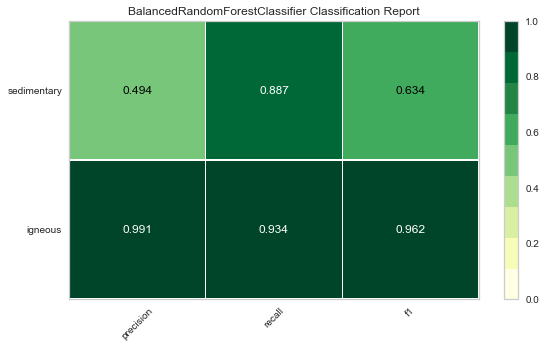

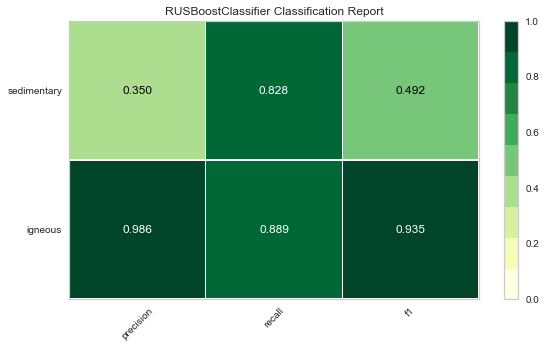

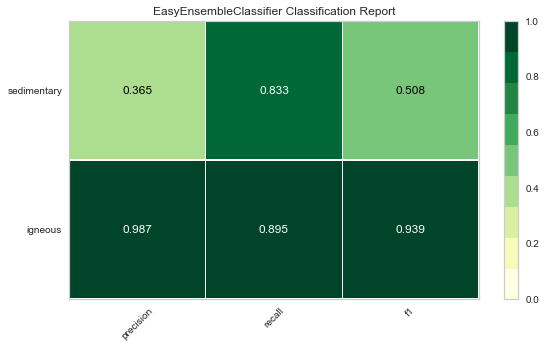

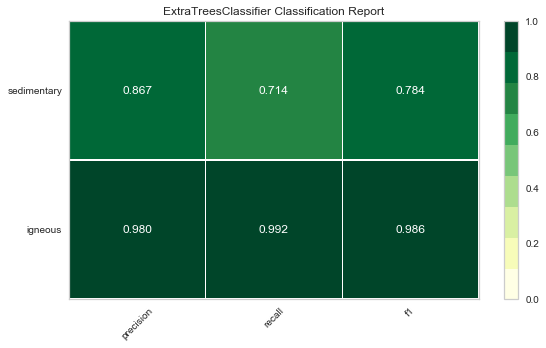

In [20]:

models = [BalancedRandomForestClassifier(n_estimators=300, max_depth=None, min_samples_split=2,max_features='sqrt',sampling_strategy='not minority', n_jobs=2,random_state=101), RUSBoostClassifier(n_estimators=300,sampling_strategy='not minority', random_state= 101), EasyEnsembleClassifier(n_estimators=100, sampling_strategy='not minority', random_state= 101, n_jobs=2 ), ExtraTreesClassifier(n_estimators=300,max_features='sqrt',random_state=101,)]


# visualise 4 model results on different data transforms - scaled data

def visualise_model(X_train, y_train, X_test, y_test, estimator, **kwargs):
    """
    Test various estimators.
    """
    
    # Instantiate the classification model and visualizer
    visualizer = ClassificationReport(
        model, classes=['igneous', 'sedimentary'],
        cmap="YlGn", size=(600, 360),is_fitted=False, **kwargs
    )
    visualizer.fit(X_train, y_train)
    visualizer.score(X_test, y_test)
    visualizer.show()

for model in models:
    visualise_model(X_train_scaled, y_train, X_valid_scaled, y_valid, model)

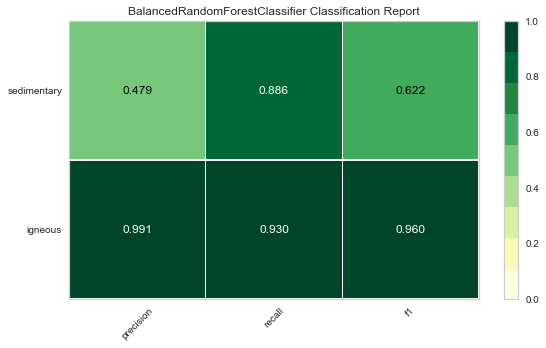

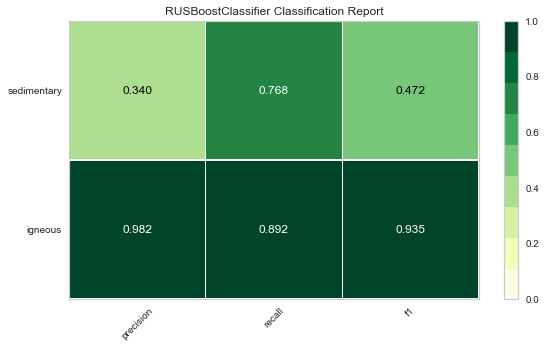

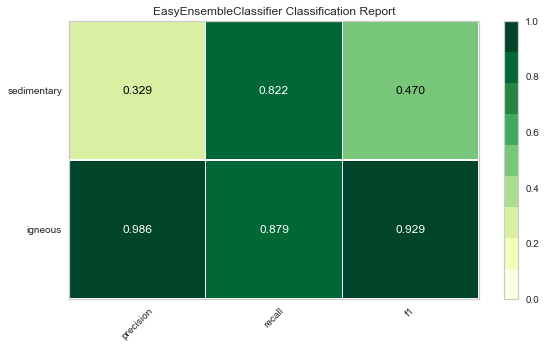

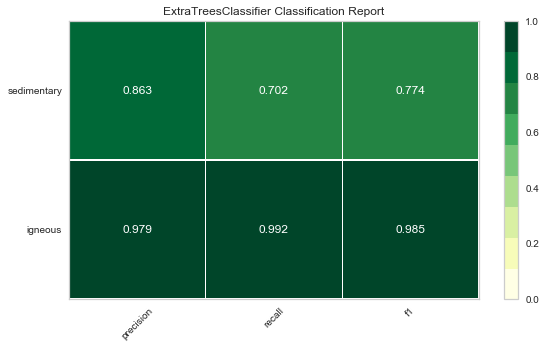

In [21]:
# visualise 4 model results on different data transforms - ilr transform

for model in models:
    visualise_model(X_train_ilr, y_train, X_valid_ilr, y_valid, model)

In [ ]:
# CV F1 score on 4 different classifiers - scaled data only
def visualise_CV_f1(X_train, y_train, X_test, y_test, estimator, **kwargs):
    """
    Test various estimators.
    """
    
    # Instantiate the classification model and visualizer
    cv = StratifiedKFold(n_splits=5, random_state=101)
    
    visualizer = CVScores(
        model, cv=cv, scoring='f1_weighted', **kwargs
    )
    visualizer.fit(X_train, y_train)
    visualizer.score(X_test,y_test)
    visualizer.show()

for model in models:
    visualise_CV_f1(X_train_scaled, y_train, model)

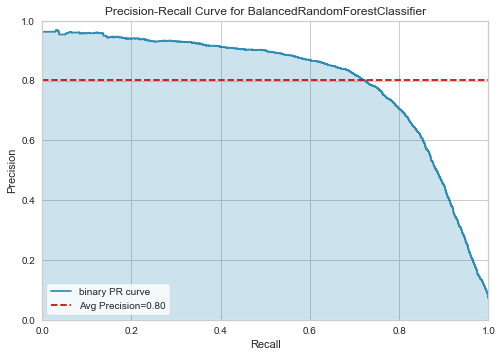

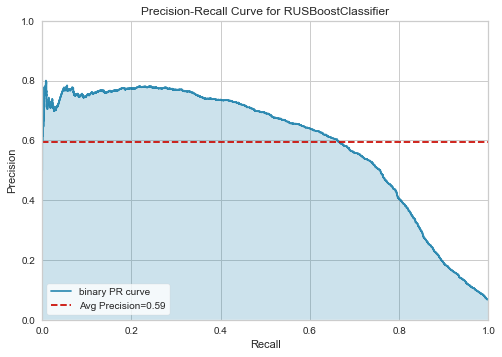

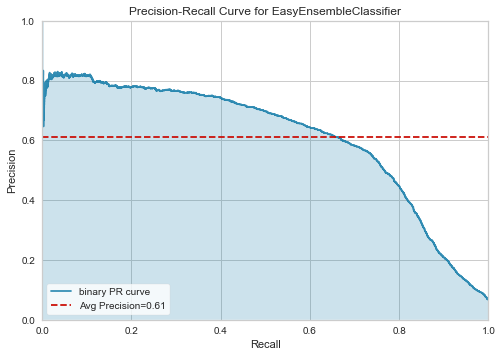

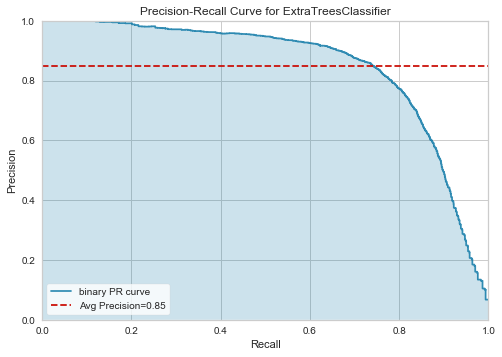

In [24]:
# PR curve on 4 different classifiers - scaled data only
def visualise_PRcurve(X_train, y_train, X_test, y_test, estimator, **kwargs):
    """
    Test various estimators.
    """
    
    # Instantiate the classification model and visualizer
    
    visualizer = PrecisionRecallCurve(
        model, classes=classes, is_fitted=False, **kwargs
    )
    visualizer.fit(X_train, y_train)
    visualizer.score(X_test,y_test)
    visualizer.show()

for model in models:
    visualise_PRcurve(X_train_scaled, y_train, X_valid_scaled, y_valid, model)